# Image & Video Technology and Analysis 
## Semester 8 - Spring 2021
## Laboratory Project 2
    Christos Dimopoulos (031 17 037)
    Drosos Lalias (031 17 881)

# 1. Θεωρητικό Μέρος

**Διαβάστε τα άρθρα An iterative image registration technique with an application to stereo vision και Pyramidal Implementation of the Affine Lucas Kanade Feature Tracker Description of the algorithm και κατανοήσετε τις παραμέτρους στο Motion Analysis and Object Tracking (calcOpticalFlowPyrLΚ). Αναλύστε σύντομα σε ένα text cell του ipynb αρχείου σας (το πολύ σε δύο παραγράφους) το πώς λειτουργεί η πυραμίδα στο Lucas Kanade Feature Tracker και για ποιο λόγο χρησιμοποιείται.**

Θεωρούμε την αναπαράσταση της πυραμίδας μιας γενικής εκόνας Ι διαστάσεων (nx,ny) ως εξής:
* Στη βάση της πυραμίδας βρίσκεται η αρχική εικόνα στην αρχική της ανάλυση (highest resolution) δηλαδή I^0 = I.
* Kάθε επόμενο επίπεδο L της πυραμίδας προκύπτει αναδρομικά με χρήση του αμέσως προηγούμενου του L-1 ως εξής:
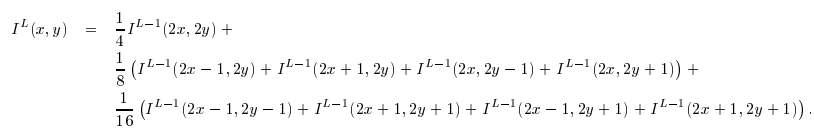
<br> ενώ η ανάλυση του εν λόγω επιπέδου θα δίνεται επίσης αναδρομικά ως:<br>
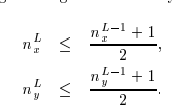

<br>

Ο αλγόριθμος ανίχνευσης κίνησης με πυραμίδα λοιπόν λειτουργεί ως εξής: Έστω σημείο $u =[u_x,u_y]$ της εικόνας για το οποίο θέλουμε να ανιχνεύσουμε κίνηση. Οι συντεταγμένες του σημείου $u^L =[u_x^L,u_y^L]$  στο επίπεδο L της πυραμίδας θα είναι: $u^L = u/2^L$  Αρχικά, υπολογίζονται η οπτική ροή και ο πίνακας αφινικού μετασχηματισμού του σημείου στο βαθύτερο επίπεδο της πυραμίσας (έστω Lm). Στη συνέχεια, το αποτέλεσμα αυτό μεταφέρεται με propagation στο αμέσως προηγούμενο επίπεδο $L_(m-1)$ στη μορφή αρχικής εκτίμησης της μετατόπισης του συγκεκριμένου πίξελ και του αφινικού μετασχηματισμού στο επίπεδο αυτό. Με βάση την εκτίμηση αυτή, προσδιορίζεται εκ νέου η οπτική ροή και ο affine transformation matrix στο επίπεδο $L_(m-1)$ και συνεχίζουμε αναδρομικά μέχρι να φτάσουμε στη βάση της πυραμίδας.<br>

Ο κύριος λόγος για τον οποίο χρησιμοποιούμε την αναπαράσταση με πυραμίδα είναι επειδή θέλουμε να διαχειριστούμε κίνησεις πολλών pixel (περισσότερων από το μέγεθος του ολοκληρωτικού παραθύρου του αλγορίθμου Lucas-Kanade). Ως εκ τούτου, το ολικό ύψος της πυραμίδας επιλέγεται με βάση τη μέγιστη αναμενόμενη οπτική ροή της εικόνας και συνήθως επαρκεί ένα ύψος της τιμής 4. Τέλος, η κατασκευή της πυραμίδας καθεαυτής συνίσταται στην εφαρμογή βαθυπερατού φιλτραρίσμαοτς για την αποφυγή aliasing κατά την υποδειγματοληψία.


# 2. Πειραματικό Μέρος

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from matplotlib import rcParams, pyplot as plt
from google.colab import drive
drive.mount('/content/drive')
from skimage.feature import corner_harris, corner_subpix, corner_peaks,corner_shi_tomasi
from skimage.transform import warp, AffineTransform
from skimage.draw import ellipse
from skimage.util import random_noise
from IPython.display import Image, display

%matplotlib inline


Mounted at /content/drive


In [ ]:
cd ../content/drive/MyDrive/Colab Notebooks

/content/drive/MyDrive/Colab Notebooks


## Ερώτημα 1

Το βίντεο που αντιστοιχεί στην ομάδας μας είναι το **VIRAT_S_010200_00_000060_000218.mp4**. Ανεβάζουμε το εν λόγω βίντεο στο drive και για κάθε frame "ρίχνουμε" την ποιότητά του κατά 50% χρησιμοποιώντας την συνάρτηση resize. Στη συνέχεια, αποθηκεύουμε το νέο βίντεο χαμηλότερης ανάλυσης στο drive για χρήση στα επόμενα ερωτήματα.

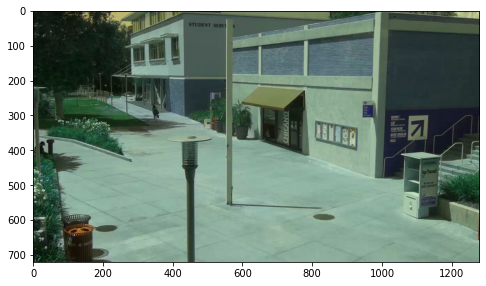

In [ ]:
# Part 1: Read Input Video
cap = cv2.VideoCapture("input_video.mp4")
ret, frame = cap.read()
plt.rcParams['figure.figsize'] = [8, 8]

frame1 = cv2.resize(frame, (frame.shape[1]//2, frame.shape[0]//2), interpolation=cv2.INTER_CUBIC) # resize to half resolution
plt.imshow(frame, cmap='gray')
plt.show()

In [ ]:
# Save the entire video to half resolution to avoid crashing later on
cap = cv2.VideoCapture("input_video.mp4")
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
resized_height = int(height//2)
resized_width = int(width//2)
resized_video = cv2.VideoWriter("resized_video.mp4", cv2.VideoWriter_fourcc(*'mp4v'), cap.get(cv2.CAP_PROP_FPS), (resized_width,resized_height))

while (cap.isOpened()):
    ret, frame = cap.read()
    if not ret:
        break
    resized_video.write(cv2.resize(frame, (resized_width,resized_height), interpolation = cv2.INTER_AREA))
cap.release()
resized_video.release()
cv2.destroyAllWindows()

## Ερώτημα 2

Στη συνέχεια, εστιάζουμε μόνο στο πρώτο frame του βίντεο και εφαρμόζουμε τους ανιχνευτές γωνιών Harris και Shi-Tomasi, πειραματιζόμενοι με τις τιμές των παραμέτρων maxCorners, qualityLevel, minDistance. Η σημασία καθεμιάς εκ των παραμέτρων είναι η ακόλουθη:
* Το maxCorners είναι ο μέγιστος αριθμός των γωνιών που θα επιστραφούν. Σε περίπτωση ύπαρξης περισσότερων από την τιμή του maxCorners, θα επιστραφούν οι πιο έντονες.
* Το qualityLevel είναι η ελάχιστη αποδεκτή ποιότητα γωνιών της εικόνας.
* Το minDistance είναι η ελάχιστη δυνατή Ευκλείδια απόσταση μεταξύ των περιστρεφόμενων γωνιών.

In [ ]:
# Part 2: Edge Detection

# Different Parameter Combinations
#maxCorners, qualityLevel, minDistance
max_corners = [50, 100, 200, 300]
quality = [0.01, 0.005, 0.1]
mindistance = [5, 10, 20]
feature_params1 = dict(maxCorners = max_corners[0], qualityLevel = quality[1], minDistance = mindistance[1])
feature_params2 = dict(maxCorners = max_corners[0], qualityLevel = quality[0], minDistance = mindistance[1])
feature_params3 = dict(maxCorners = max_corners[1], qualityLevel = quality[0], minDistance = mindistance[1])
feature_params4 = dict(maxCorners = max_corners[2], qualityLevel = quality[0], minDistance = mindistance[0])
feature_params5 = dict(maxCorners = max_corners[2], qualityLevel = quality[0], minDistance = mindistance[1])
feature_params6 = dict(maxCorners = max_corners[2], qualityLevel = quality[1], minDistance = mindistance[1])
feature_params7 = dict(maxCorners = max_corners[2], qualityLevel = quality[0], minDistance = mindistance[2])
feature_params8 = dict(maxCorners = max_corners[2], qualityLevel = quality[2], minDistance = mindistance[1])
feature_params9 = dict(maxCorners = max_corners[3], qualityLevel = quality[0], minDistance = mindistance[1])
feature_params10 = dict(maxCorners = max_corners[3],qualityLevel = quality[0], minDistance = mindistance[2])

parameters = [feature_params1,feature_params2,feature_params3,feature_params4,feature_params5,feature_params6,feature_params7,feature_params8,feature_params9,feature_params10]

In [ ]:
def corner_detect(image, parameters):
  # Convert to grayscale
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  temp = np.array(image)
  # Harris corner detection
  corners1 = cv2.goodFeaturesToTrack(gray_image,**parameters, useHarrisDetector=True)
  corners1 = np.int0(corners1) #convert to int to make circles
  for i in corners1:
      x,y = i.ravel()
      cv2.circle(temp,(x,y),3,255,-1)


  plt.rcParams['figure.figsize'] = [12, 12]
  fig, axs = plt.subplots(1,2)
  axs[0].imshow(temp)
  title1 = 'maxCorners = '+str(parameters['maxCorners'])+', qualityLevel = '+str(parameters['qualityLevel'])+', minDistance = '+str(parameters['minDistance'])
  title2 = 'maxCorners = '+str(parameters['maxCorners'])+', qualityLevel = '+str(parameters['qualityLevel'])+', minDistance = '+str(parameters['minDistance'])

  axs[0].set_title(title1)

  temp = np.array(image)
  # ShiTomasi corner detection
  corners2 = cv2.goodFeaturesToTrack(gray_image,**parameters, useHarrisDetector=False)
  corners2 = np.int0(corners2) #convert to int to make circles
  for i in corners2:
      x,y = i.ravel()
      cv2.circle(temp,(x,y),3,255,-1)

  axs[1].imshow(temp)
  axs[1].set_title(title2)
  plt.show()

Harris Detector (left) - Shi-Tomasi Detector (Right)


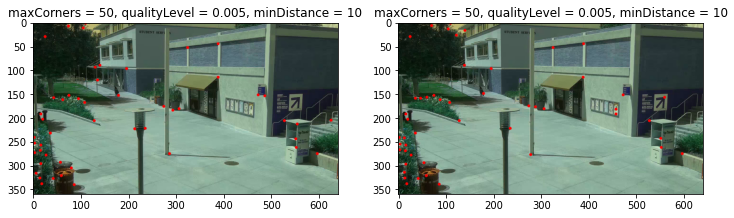

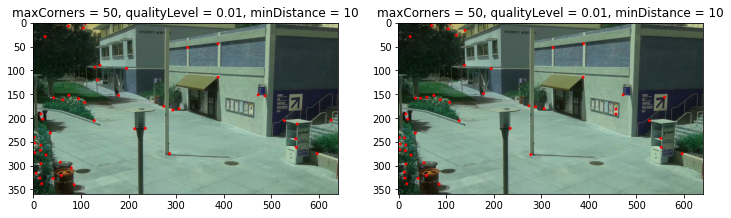

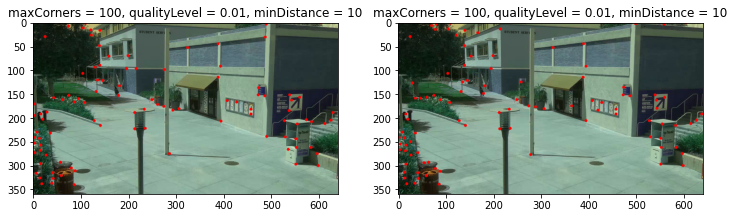

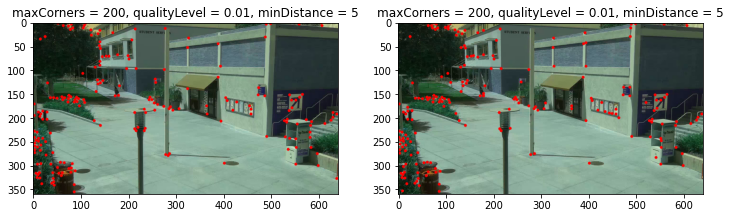

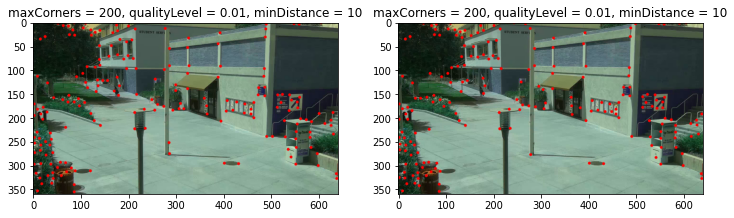

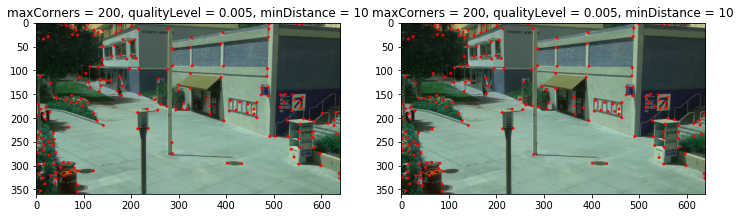

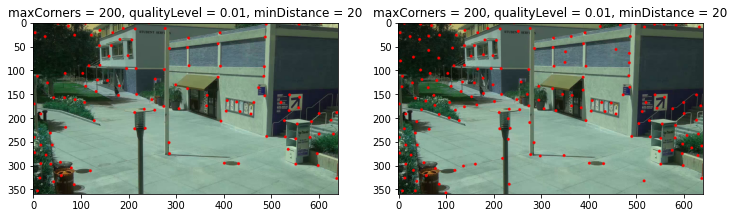

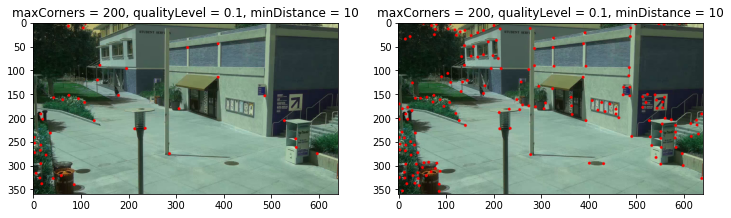

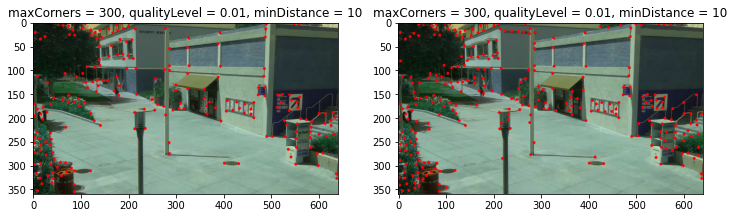

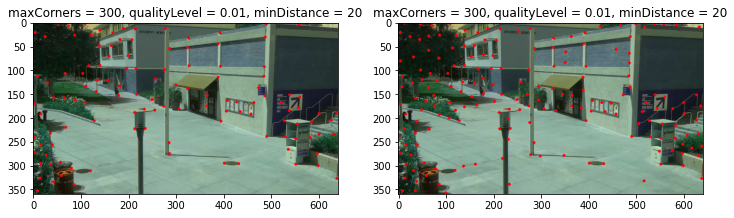

In [ ]:
print('Harris Detector (left) - Shi-Tomasi Detector (Right)')
for params in parameters:
  corner_detect(frame1, params)

Παρατηρούμε ότι εν γένει ο ανιχνευτής **Shi-Tomasi** δίνει καλύτερα αποτελέσματα από τον **Harris**, καθώς εντοπίζει περισσότερα σημεία ενδιαφέροντος που αντιστοιχούν σε πραγματικές γωνίες της εικόνας. Αυτό οφείλεται στο γεγονός ότι ο πρώτος επιστρέφει σημεία που αναπαριστούν το σχήμα των αντικειμένων με μεγαλύτερη ομοιομορφία έναντι του δεύτερου ανιχνευτή, ο οποίος επηρεάζεται άμεσα από τη φωτεινότητα και τις σκιές των αντικειμένων. Γνωρίζουμε άλλωστε ότι ο ανιχνευτής Shi-Tomasi συνιστά μια πανομοιότυπη έκδοση του ανιχνευτή Harris με βελτιωμένο κριτήριο ανίχνευησης.<br>
Όσον αφορά την επίδραση των παραμέτρων, δε, βλέπουμε ότι προφανώς αύξηση της τιμής **maxCorners** θα έχει ως αποτέλεσμα να επιστραφούν περισσότερα ανιχνευθέντα σημεία ενδιαφέροντος και αντιστοίχως μείωση της παραμέτρου οδηγεί σε λιγότερα σημεία ενδιαφέροντος (σχέση αναλογίας). Από την άλλη, η παράμετρος **qualityLevel** συνιστά την κατωφλιοποίηση των ανιχνευθέντων σημείων. Ως εκ τόυτου, ελάττωση της συνεπάγεται τον εντοπισμό περισσότερων σημείων, που συχνά όμως δεν αντιστοιχούν σε πραγματικές γωνίες, ενώ αυ΄ξηση της συνεπάγεται τον εντοπισμό λιγότερων σημείων ενδιαφέροντος. Τέλος, η παράμετρος **minDistance** φαίνεται να καθορίζει τη διασπορά στον χώρο των σημείων ενδιαφέροντος που ανιχνεύονται, καθώς μικρές τιμές της οδηγούν σε συγκεντρωμένες πυκνές ανιχνεύσεις, ενώ μεγάλες τιμές σε πιο διασκορπισμένες. Αυξάνοντας την τιμή της παραμέτρου minDistance σε συνδυασμό με μικρό αριθμό maxCorners οδηγούμαστε σε ένα όχι και τόσο ικανοποιητικό αποτέλεσμα ανίχνευσης.<br>
Πειραματιζόμενοι με τις διαφορετικές τιμές των παραμέτρων, καταφέρνουμε να απορρίψουμε με ευκολία ένα πλήθος συνδυασμών τους. Με ελάχιστη ποιοτική διαφορά, ωστόσο, καταλήγουμε στο συμπέρασμα ότι ένας σχετικά βέλτιστος συνδυασμός παραμέτρων, τόσο για την ανίχνευση των γωνιών όσο και για την παρακολούθηση της οπτικής ροής αργότερα είναι ο εξής:<br> <br>
***maxCorners = 300, qualityLevel = 0.01, minDistance = 10***

## Ερώτημα 3

Στη συνέχεια, εφαρμόζουμε τον αλγόριθμο Lucas-Kanade για την παρακολούθηση της οπτικής ροής του βίντεο εισόδου με βάση τα σημεία ενδιαφέροντος που ανιχνεύτηκαν στο προηγούμενο ερώτημα. Πειραματιζόμαστε με τις τιμές των ακόλουθων παραμέτρων:<br>
* Το winSize δηλαδή το μέγεθος του παραθύρου σε κάθε επίπεδο της πυραμίδας.
* Το **maxLevel** δηλαδή τον αριθμό του μέγιστου επιπέδου πυραμίδας. Η αρίθμηση ξεκινάει από το 0.
* Το **criteria**, δηλαδή τα κριτήρια τερματισμού του επαναληπτικού αλγορίθμου αναζήτησης. Η παράμετρος αυτή συνυφαίνεται με την παράμετρο **maxCounts** που εκφράζει τον μέγιστο αριθμό επαναλήψεων που θα κάνει ο αλγόριμος καθώς και με την παράμετρο **epsilon** η οποία καθορίζει το ελάχιστο παράθυρο αναζήτησης που μπορεί να επεξεργαστεί ο αλγόριθμος.

In [ ]:
# Detectors Parameters
gray_image = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
# Harris Parameters 
harris_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 10, blockSize = 7, useHarrisDetector = True)
harris = cv2.goodFeaturesToTrack(gray_image, **harris_parameters)

# Shi-Tomasi Parameters 
shit_tomasi_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 8, blockSize = 5, useHarrisDetector = False)
shi_tomasi = cv2.goodFeaturesToTrack(gray_image, **shit_tomasi_parameters) 

In [ ]:
def Lucas_Kanade(winSize, maxLevel, criteria, corners):
    cap = cv2.VideoCapture("resized_video.mp4") # read resized video
    ret, frame1 = cap.read()
    gray_frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

    lucas_kanade_parameters = dict(winSize = winSize, maxLevel = maxLevel, criteria = criteria) 

    # Create a mask image for drawing purposes
    mask = np.zeros_like(frame1)
    color = (0, 0, 255) # red marker
    while(cap.isOpened()):
        ret, frame = cap.read()
        if not ret:
            break
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) # next frame
        # calculate optical flow
        p1, st, err = cv2.calcOpticalFlowPyrLK(gray_frame1, gray_frame, corners, None, **lucas_kanade_parameters) 
        good_old = corners[st == 1]   #good features prev position
        good_new = p1[st == 1]   #good features next position
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()   
            c, d = old.ravel()  
            mask = cv2.line(mask, (a, b), (c, d), color, 2)  
            frame = cv2.circle(frame, (a, b), 3, color, -1)   
        output = cv2.add(frame, mask)
        gray_frame1 = gray_frame.copy()  # update prev frame
        corners = good_new.reshape(-1, 1, 2)
        cv2_imshow(output)
    cap.release()

Αρχικά, πειραματιζόμαστε για τις διαφορές τιμές των παραμέτρων πάνω στους ανιχνευτές Harris

In [ ]:
# Optical Flow for Harris - different parameters
Optical_Flow((15, 15), 2, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03), harris)

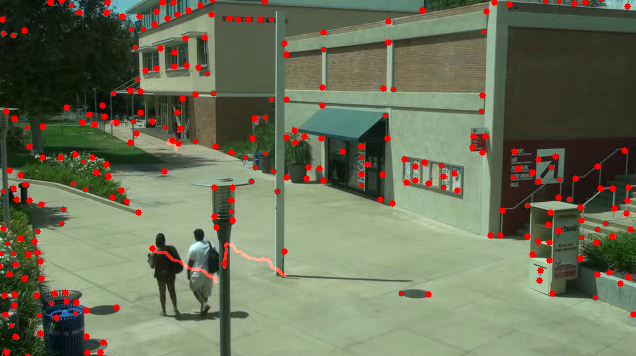

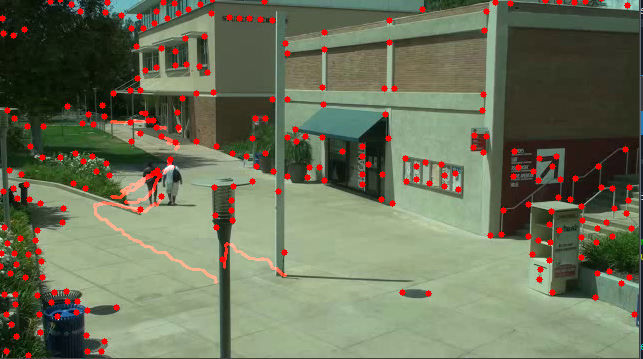

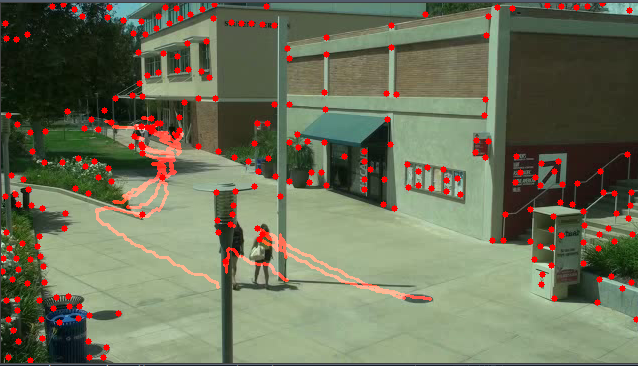

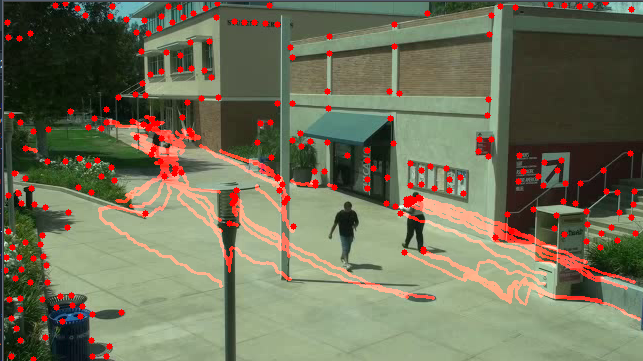

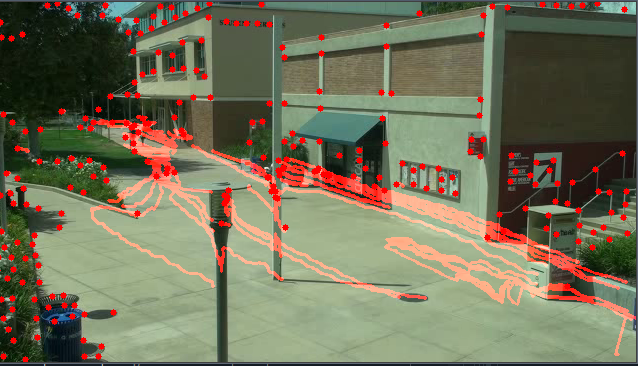

In [ ]:
listOfImageNames = ['screenshots/part3/harris/experiment1/Screenshot_1.png',
                    'screenshots/part3/harris/experiment1/Screenshot_2.png',
                    'screenshots/part3/harris/experiment1/Screenshot_3.png',
                    'screenshots/part3/harris/experiment1/Screenshot_4.png',
                    'screenshots/part3/harris/experiment1/Screenshot_5.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Λαμβάνουμε αρκετά ικανοποιητικά αποτελέσματα. Στη συνέχεια, αυξάνουμε το μέγεθος του παραθύρου:

In [ ]:
Optical_Flow((5,5),4, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03), harris)

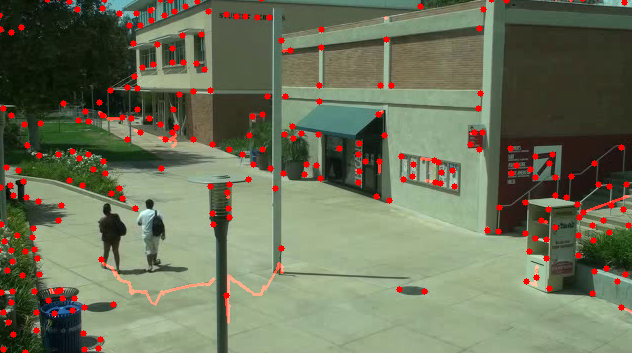

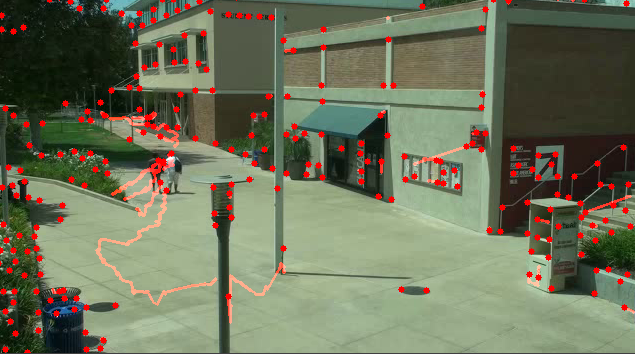

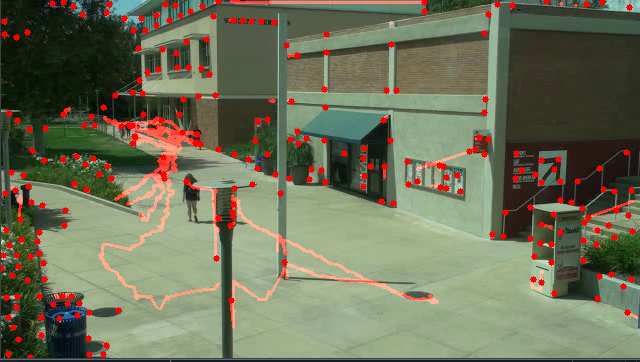

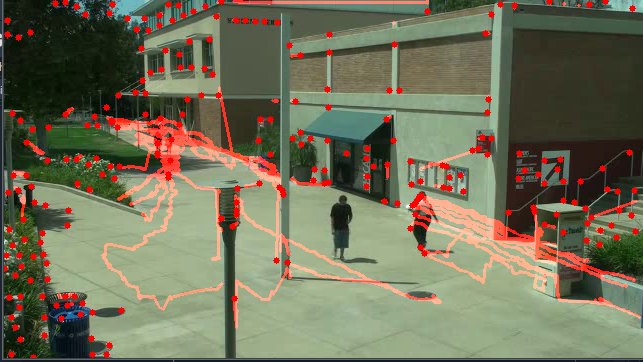

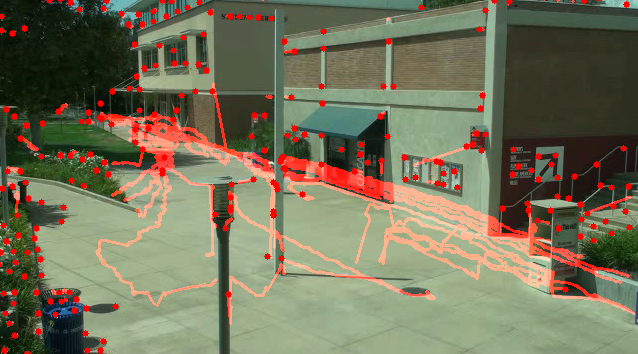

In [ ]:
listOfImageNames = ['screenshots/part3/harris/experiment2/Screenshot_1.png',
                    'screenshots/part3/harris/experiment2/Screenshot_2.png',
                    'screenshots/part3/harris/experiment2/Screenshot_3.png',
                    'screenshots/part3/harris/experiment2/Screenshot_4.png',
                    'screenshots/part3/harris/experiment2/Screenshot_5.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Παρατηρούμε ότι λόγω της μείωσης του μέγεθους του παραθύρου, σε έναν μεγάλο βαθμό, ανιχνεύεται η ύπαρξη οπτικής ροής σε σημεία που δεν υπάρχει πραγματικά κίνηση, οδηγώντας σε εσφαλμένα αποτελέσματα. Αυξάνουμε το μέγεθος παραθύρου στην τιμή 20 καθώς και το πλήθος των επαναλήψεων του κριτηρίου σε 40:

In [ ]:
Optical_Flow((20,20),4, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 40, 0.03), harris)

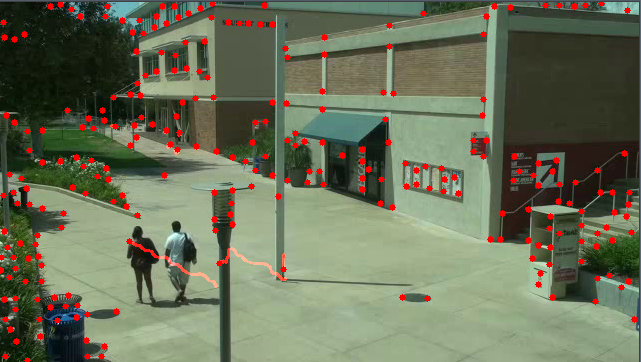

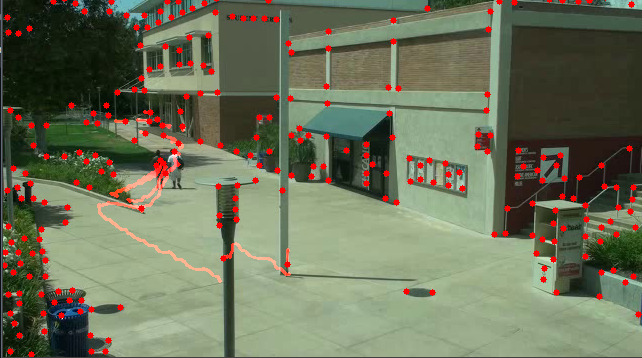

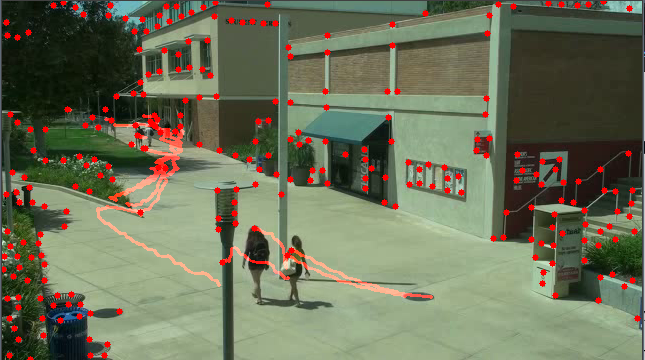

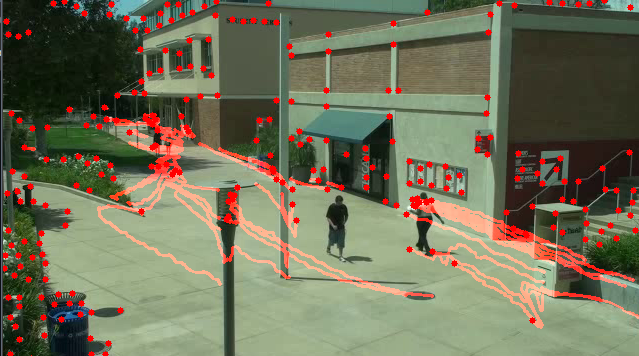

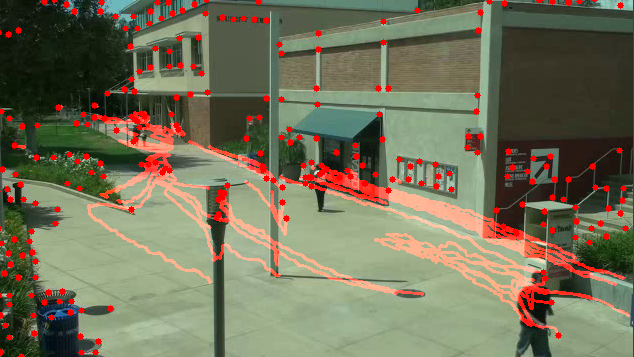

In [ ]:
listOfImageNames = ['screenshots/part3/harris/experiment3/Screenshot_1.png',
                    'screenshots/part3/harris/experiment3/Screenshot_2.png',
                    'screenshots/part3/harris/experiment3/Screenshot_3.png',
                    'screenshots/part3/harris/experiment3/Screenshot_4.png',
                    'screenshots/part3/harris/experiment3/Screenshot_5.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Παρατηρούμε ότι το αποτέλεσμα της οπτικής ροής είναι αρκετά βελτιωμένο σε σχέση με πριν.

Ακολούθως, πειραματιζόμαστε με τον ίδιο τρόπο για τους ανιχνευτές Shi-Tomasi

In [ ]:
# Optical Flow for Shi-Tomasi - different parameters
Optical_Flow((5, 5), 4, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03), shi_tomasi)

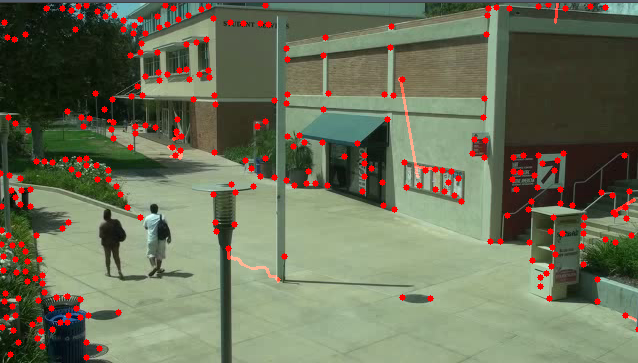

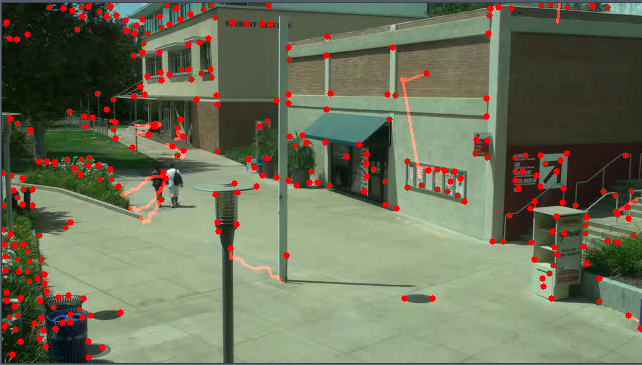

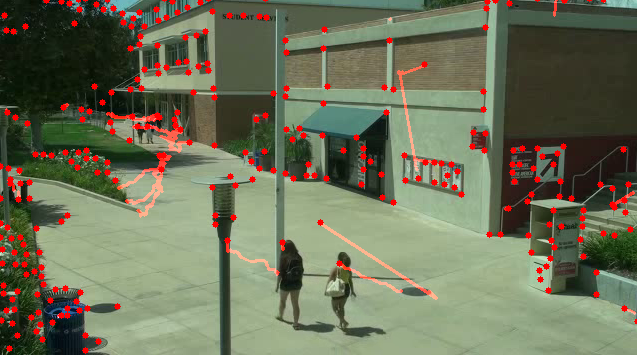

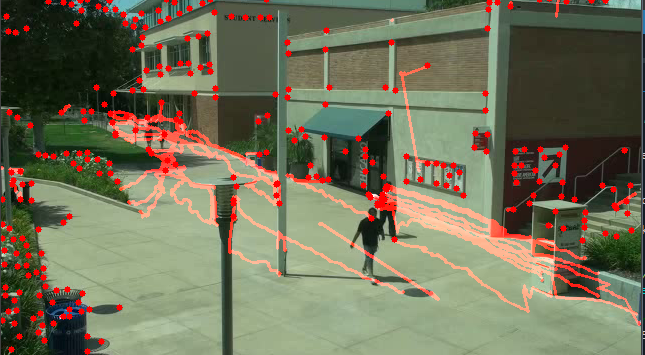

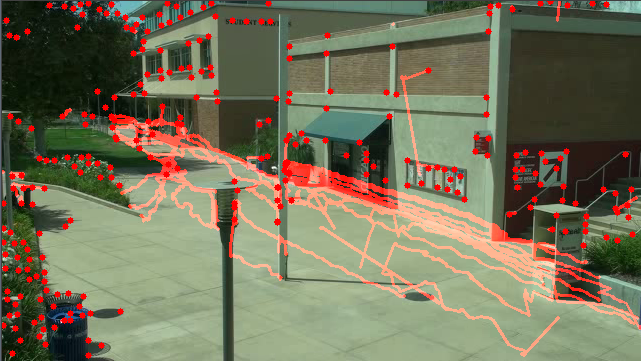

In [ ]:
listOfImageNames = ['screenshots/part3/shitomasi/experiment1/Screenshot_1.png',
                    'screenshots/part3/shitomasi/experiment1/Screenshot_2.png',
                    'screenshots/part3/shitomasi/experiment1/Screenshot_3.png',
                    'screenshots/part3/shitomasi/experiment1/Screenshot_4.png',
                    'screenshots/part3/shitomasi/experiment1/Screenshot_5.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Ομοίως με πριν ο συνδυασμός μικρού μεγέθους παραθύρου και μικρό πλήθος επαναλήψεων οδηγεί στην ανίχνευση εσφαλμένης οπτικής ροής σε σημεία που δεν υπάρχει κίνηση.

Ακολούθως, αυξάνουμε το μέγεθος παραθύρου σε 15, αλλά επιλέγουμε μεγαλύτερο βάθος πυραμίδας σε συνδυασμό με μεγαλύτερο αριθμό επαναλήψεων.

In [ ]:
# Optical Flow for Shi-Tomasi - different parameters
Optical_Flow((15, 15), 8, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 40, 0.03), shi_tomasi)

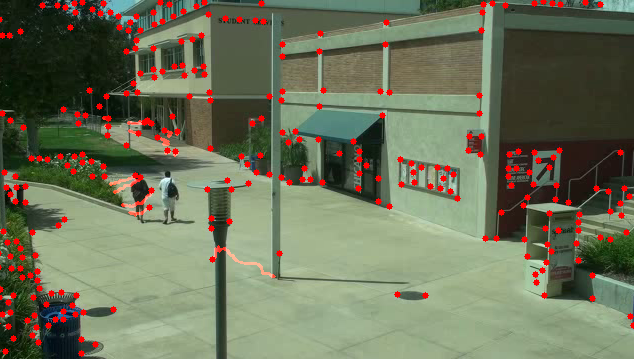

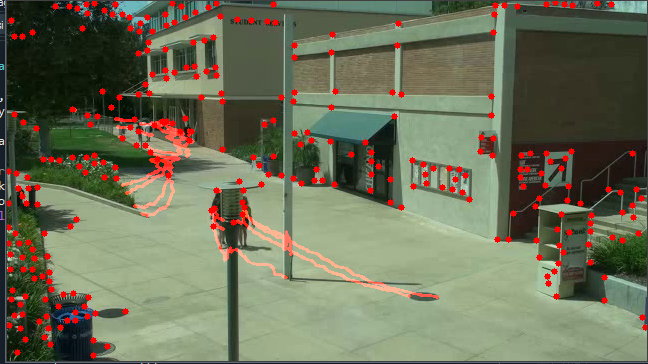

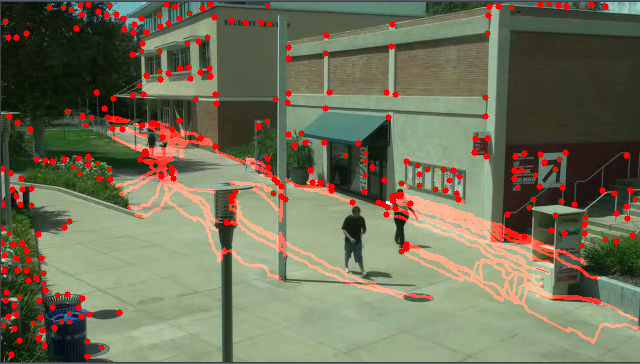

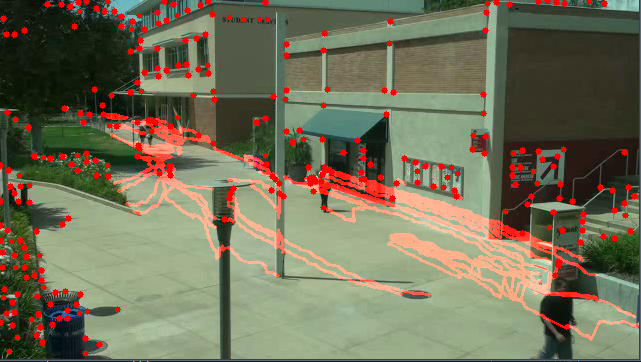

In [ ]:
listOfImageNames = ['screenshots/part3/shitomasi/experiment2/Screenshot_1.png',
                    'screenshots/part3/shitomasi/experiment2/Screenshot_2.png',
                    'screenshots/part3/shitomasi/experiment2/Screenshot_3.png',
                    'screenshots/part3/shitomasi/experiment2/Screenshot_4.png',
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Παρατηρούμε ότι η απόδοση είναι αρκετά βελτιωμένη. Η αύξηση του βάθους της πυραμίδας δεν φαίνεται να συνεισφέρει αισθητά καθώς έχουμε κατά κύριο λόγο αργή κίνηση.

Τέλος, αυξάνουμε ακόμα περισσότερο το μέγεθος παραθύρου αλλά ταυτόχρονα μειώνουμε την τιμή της παραμέτρου epsilon:

In [ ]:
# Optical Flow for Shi-Tomasi - different parameters
Optical_Flow((20, 20), 4, (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 40, 0.01), shi_tomasi)

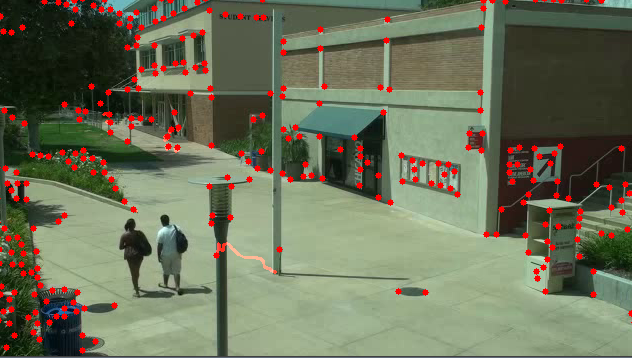

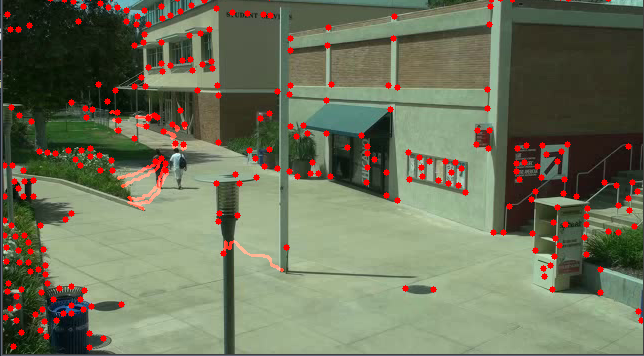

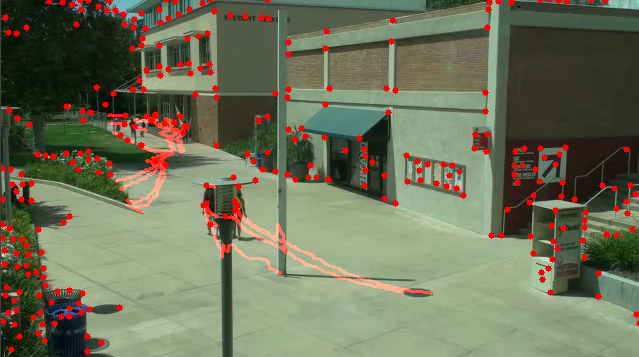

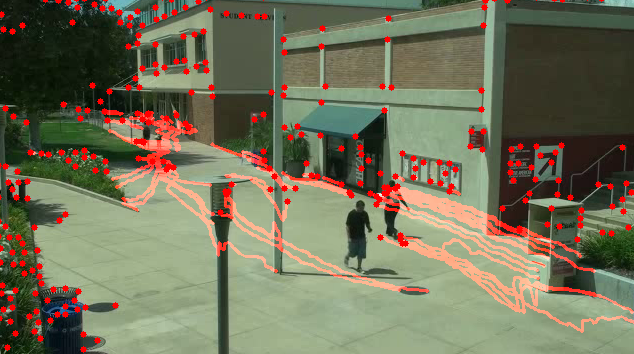

In [ ]:
listOfImageNames = ['screenshots/part3/shitomasi/experiment3/Screenshot_1.png',
                    'screenshots/part3/shitomasi/experiment3/Screenshot_2.png',
                    'screenshots/part3/shitomasi/experiment3/Screenshot_3.png',
                    'screenshots/part3/shitomasi/experiment3/Screenshot_4.png',
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Συνοψίζοντας μπορούμε να συμπεράνουμε τα εξής:
* Συχνά, αύξηση του μεγέθους του παραθύρου που περιβάλλει το εκάστοτε σημείο ενδιαφέροντος σε ένα συγκεκριμένο frame του βίντεο συνεπάγεται μεγαλύτερο
αριθμό ανιχνευθέντων γωνιών, οι οποίες όμως ενδέχεται να μην αντιστοιχούν σε πραγματικά επιθυμητά σημεία.
* Μεταβάλλοντας το πλήθος των επιπέδων της πυραμίδας κλιμάκων που χρησιμοποιεί ο αλγόριθμος Lucas Kanade, δεν παρατηρούμε σημαντική αλλαγή στα οπτικά αποτελέσματα, διότι τα περισσότερα επίπεδα ενδείκνυνται κυρίως για γρήγορες κινήσεις. Όμως, τα περισσότερα επίπεδα στον αλγόριθμο Lucas-Kanade, μπορεί να προκαλέσουν περισσότερο flickering, δηλαδή αστάθεια μετατοπίσεων στα σημεία ενδιαφέροντος.
* Τέλος, μεγαλύτερος αριθμός επαναλήψεων του αλγορίθμου συνεπάγεται καλύτερη σύγκλιση στις υπολογιζόμενες μετατοπίσεις, αντιμετωπίζοντας έτσι το flickering.
* Οι ανιχνευτές Shi-Tomasi φαίνεται να παρέχουν σχετικά περισσότερη σταθερότητα από τους ανιχνευτές Harris, χωρίς βέβαια η διαφορά αναμεσά τους να είναι τεράστια, τουλάχιστον στο εν λόγω βίντεο.



## Μέρος 4

Ακολούθως, τροποποιούμε τη συνάρτηση Lucas_Kanade , με στόχο την παρακολούθηση γωνιών Harris και Shi-Tomasi που εμφανίστηκαν στο βίντεο μετά το πρώτο frame. Χρησιμοποιούμε τις τιμές των παραμέτρων που μας έδωσαν τα καλύτερα αποτελέσματα στα δύο προηγούμενα ερωτήματα και ενημερώνουμε τα σημεία που παρακολουθούνται ανά 5 frame.

In [ ]:

def follow_corners(detector):

    color = (0, 0, 255) # color marker
    counter = 0 # counter of frames that is activated every 25 frames
    dis = 0.3
    frame_activate = 25 # track corners every 25 frames

    cap = cv2.VideoCapture("resized_video.mp4") # read half-resolution video
    ret, frame1 = cap.read()
    gray_frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    mask = np.zeros_like(frame1)

    if(detector == 'Harris'):
        harris_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = True)
        corners = cv2.goodFeaturesToTrack(gray_frame1, **harris_parameters)
    if(detector == 'Shi-Tomasi'):
        shi_tomasi_parameters = dict(maxCorners = 250, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = False)
        corners = cv2.goodFeaturesToTrack(gray_frame1, **shi_tomasi_parameters)

    while(cap.isOpened()):
        ret, frame = cap.read()
        if not ret:
            break
        counter += 1
        
        
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                 
        lucas_kanade_parameters = dict(winSize = (20, 20), maxLevel = 4, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 40, 0.03))
        p1, status, error = cv2.calcOpticalFlowPyrLK(gray_frame1, gray_frame, corners, None, **lucas_kanade_parameters)
        good_old = corners[status == 1]
        good_new = p1[status == 1]
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            if np.sqrt((b - d) ** 2 + (a - c) ** 2) >= dis: 
                mask = cv2.line(mask, (a, b), (c, d), color, 2)
                frame = cv2.circle(frame, (a, b), 3, color, -1)

        result = cv2.add(frame, mask)
        gray_frame1 = gray_frame.copy() # update prev frame
        corners = good_new.reshape(-1, 1, 2)
        cv2_imshow('',result)
        
        if counter == frame_activate:
            counter = 0 # reset counter
            # Detect new points of interest for current frame
            if(detector == 'Harris'):
                harris_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = True)
                corners = cv2.goodFeaturesToTrack(gray_frame, **harris_parameters)
            if(detector == 'Shi-Tomasi'):
                shi_tomasi_parameters = dict(maxCorners = 250, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = False)
                corners = cv2.goodFeaturesToTrack(gray_frame, **shi_tomasi_parameters)


        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()

Αρχικά, εφαρμόζουμε τη συνάρτηση με τη χρήση Harris ανιχνευτή.

In [ ]:
# Harris Detector
follow_corners('Harris')

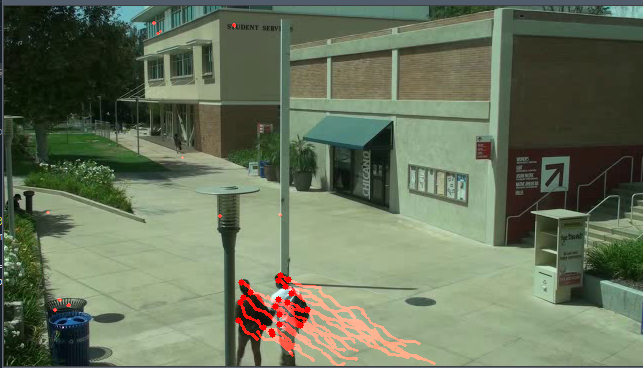

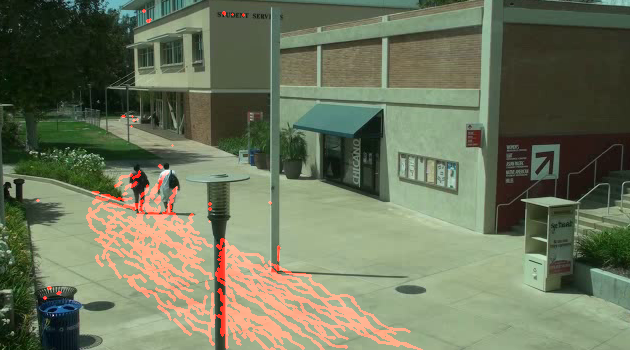

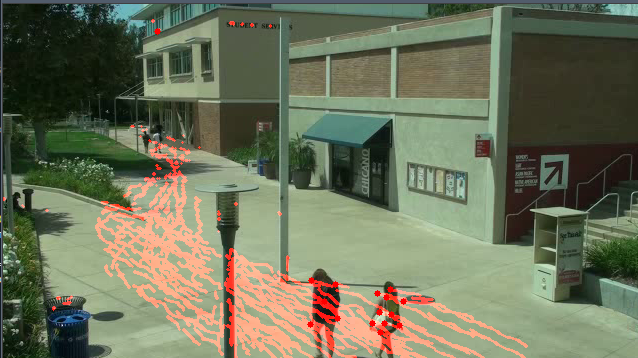

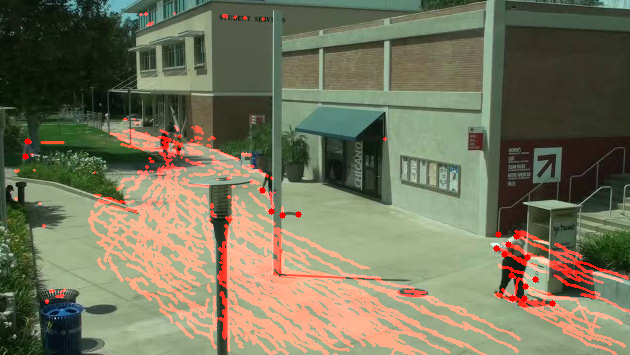

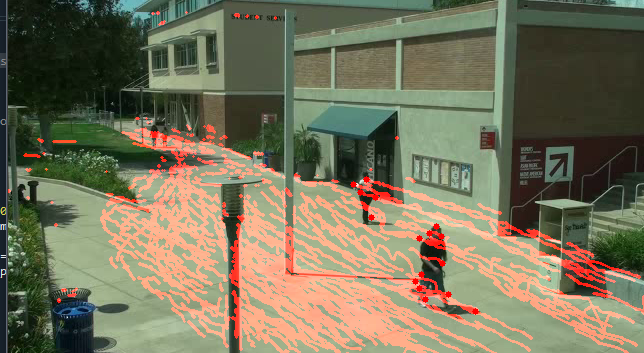

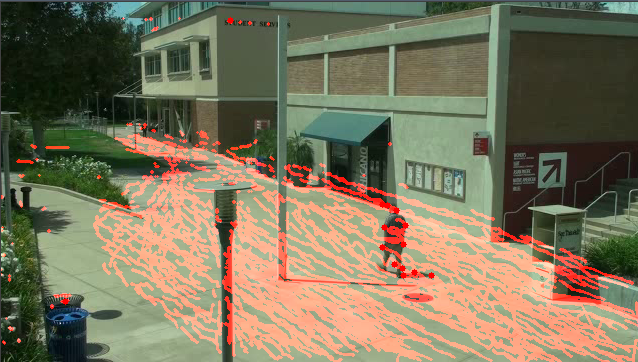

In [ ]:
listOfImageNames = ['screenshots/part4/harris/Screenshot_1.png',
                    'screenshots/part4/harris/Screenshot_2.png',
                    'screenshots/part4/harris/Screenshot_3.png',
                    'screenshots/part4/harris/Screenshot_4.png',
                    'screenshots/part4/harris/Screenshot_5.png',
                    'screenshots/part4/harris/Screenshot_6.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Στη συνέχεια, επαναλαμβάνουμε τη διαδικασία αυτή τη φορά για Shi-Tomasi ανιχνευτές.

In [ ]:
# Shi-Tomasi Detector
follow_corners('Shi-Tomasi')

In [ ]:
listOfImageNames = ['screenshots/part4/shitomasi/Screenshot_1.png',
                    'screenshots/part4/shitomasi/Screenshot_2.png',
                    'screenshots/part4/shitomasi/Screenshot_3.png',
                    'screenshots/part4/shitomasi/Screenshot_4.png',
                    'screenshots/part4/shitomasi/Screenshot_5.png',
                    'screenshots/part4/shitomasi/Screenshot_6.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Παρατηρούμε λοιπόν ότι οι ανιχνευτές Harris και Shi-Tomasi συμπεριφέρονται αρκετά παρόμοια, καθώς κατά πλειονότητα, τα σημεία ενδιαφέροντος που εντοπίζουν αντιστοιχούν σε κινούμενους ανθρώπους. Ο δεύτερος βέβαια χαρακτηρίζεται από μεγαλύτερη ευρωστία και σταθερότητα στην χάραξη της κίνησης. Όσο περισσότερο όμως αυξάνουμε τον αριθμό των frames που ενημερώνεται η ανίχνευση της οπτικής ροής, τόσο περισσότερο φαίνεται να επηρεάζεται προς το αρνητικό το τελικό αποτέλεσμα καθώς τα διαδοχικά καρέ διαφέρουν κατά πολύ μεταξύ τους, κάτι που μπορεί να ερμηνευτεί σε πιο απότομη κίνηση, την οποία οι παράμετροι που επιλέξαμε δεν καλύπτουν.

## Ερώτημα 5

Στο τελευταίο μέρος της εργαστηριακής άσκησης, εξετάζουμε την επίδραση salt and pepper θορύβου στην αναγνώρισκη κίνησης από βίντεο με τον αλγόριθμο Lucas-Kanade. Τροποποιούμε κατάλληλα τη συνάρτηση του προηγούμενου ερωτήματος, ώστε να εισάγει Salt and Pepper θόρυβο, και πειραματιζόμαστε με 2 διαφορετικές τιμές.

In [ ]:
def noisy_lucas_kanade(detector, noisy, noise_param):

    color = (0, 0, 255) # color marker
    counter = 0 # counter of frames that is activated every 25 frames
    dis = 0.3
    frame_activate = 25 # track corners every 25 frames

    cap = cv2.VideoCapture("resized_video.mp4") # read half-resolution video
    ret, frame1 = cap.read()
    if noisy == False:
         gray_frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)  
    else:
         gray_frame1 = (random_noise(cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY), mode = 's&p', seed = 6, amount = noise_param) * 255).astype(np.uint8)
    mask = np.zeros_like(frame1)

    if(detector == 'Harris'):
        harris_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = True)
        corners = cv2.goodFeaturesToTrack(gray_frame1, **harris_parameters)
    if(detector == 'Shi-Tomasi'):
        shi_tomasi_parameters = dict(maxCorners = 250, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = False)
        corners = cv2.goodFeaturesToTrack(gray_frame1, **shi_tomasi_parameters)

    while(cap.isOpened()):
        ret, frame = cap.read()
        if not ret:
            break
        counter += 1
        
        if noisy==False:
            gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        else:
           # add noise
           gray_frame = (random_noise(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), mode = 's&p', seed = 5, amount = noise_param) * 255).astype(np.uint8)
                 
        lucas_kanade_parameters = dict(winSize = (20, 20), maxLevel = 4, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 40, 0.03))
        p1, status, error = cv2.calcOpticalFlowPyrLK(gray_frame1, gray_frame, corners, None, **lucas_kanade_parameters)
        good_old = corners[status == 1]
        good_new = p1[status == 1]
        for i, (new, old) in enumerate(zip(good_new, good_old)):
            a, b = new.ravel()
            c, d = old.ravel()
            if np.sqrt((b - d) ** 2 + (a - c) ** 2) >= dis: 
                mask = cv2.line(mask, (a, b), (c, d), color, 2)
                frame = cv2.circle(frame, (a, b), 3, color, -1)

        result = cv2.add(frame, mask)
        gray_frame1 = gray_frame.copy() # update prev frame
        corners = good_new.reshape(-1, 1, 2)
        cv2_imshow('',result)
        
        if counter == frame_activate:
            counter = 0 # reset counter
            # Detect new points of interest for current frame
            if(detector == 'Harris'):
                harris_parameters = dict(maxCorners = 300, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = True)
                corners = cv2.goodFeaturesToTrack(gray_frame, **harris_parameters)
            if(detector == 'Shi-Tomasi'):
                shi_tomasi_parameters = dict(maxCorners = 250, qualityLevel = 0.01, minDistance = 10, blockSize = 5, useHarrisDetector = False)
                corners = cv2.goodFeaturesToTrack(gray_frame, **shi_tomasi_parameters)


        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()

Αρχικά, εφαρμόζουμε τη συνάρτηση με τη χρήση Harris ανιχνευτή.

In [ ]:
noisy_lucas_kanade('Harris', True, 0.1)

In [ ]:
listOfImageNames = ['screenshots/part5/harris/experiment1/Screenshot_1.png',
                    'screenshots/part5/harris/experiment1/Screenshot_2.png',
                    'screenshots/part5/harris/experiment1/Screenshot_3.png',
                    'screenshots/part5/harris/experiment1/Screenshot_4.png',
                    'screenshots/part5/harris/experiment1/Screenshot_5.png',
                    'screenshots/part5/harris/experiment1/Screenshot_6.png',
                    'screenshots/part5/harris/experiment1/Screenshot_7.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

In [ ]:
noisy_lucas_kanade('Harris', True, 0.3)

In [ ]:
listOfImageNames = ['screenshots/part5/harris/experiment1/Screenshot_1.png',
                    'screenshots/part5/harris/experiment1/Screenshot_2.png',
                    'screenshots/part5/harris/experiment1/Screenshot_3.png',
                    'screenshots/part5/harris/experiment1/Screenshot_4.png',
                    'screenshots/part5/harris/experiment1/Screenshot_5.png',
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Στη συνέχεια, επαναλαμβάνουμε τη διαδικασία αυτή τη φορά για Shi-Tomasi ανιχνευτές.

In [ ]:
noisy_lucas_kanade('Shi-Tomasi', True, 0.1)

In [ ]:
listOfImageNames = ['screenshots/part5/shitomasi/experiment1/Screenshot_1.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_2.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_3.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_4.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_5.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_6.png',
                    'screenshots/part5/shitomasi/experiment1/Screenshot_7.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

In [ ]:
noisy_lucas_kanade('Shi-Tomasi', True, 0.3)

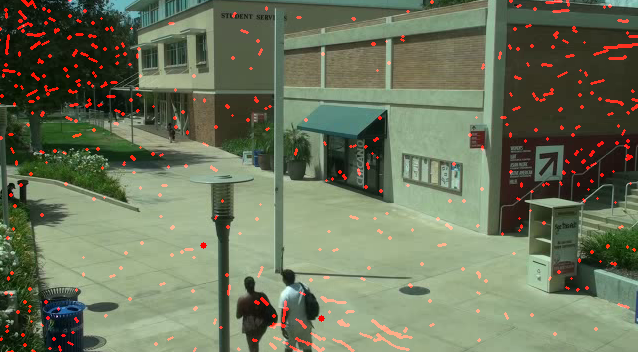

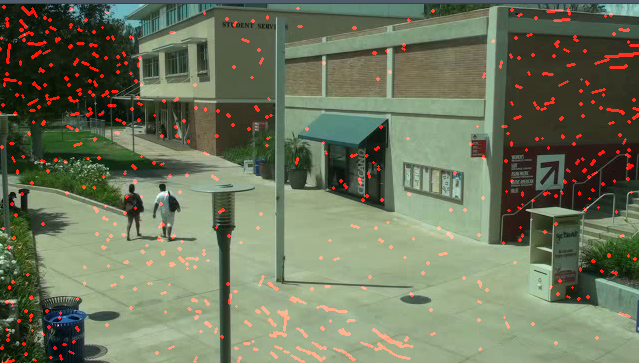

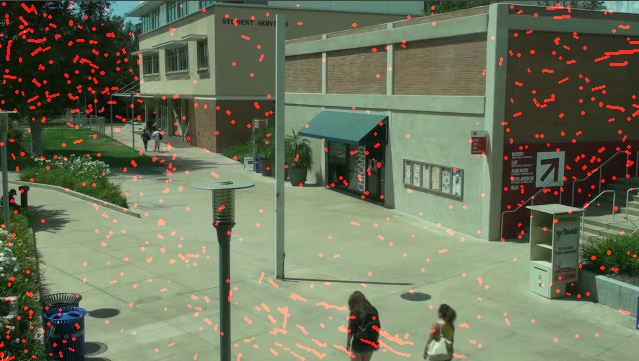

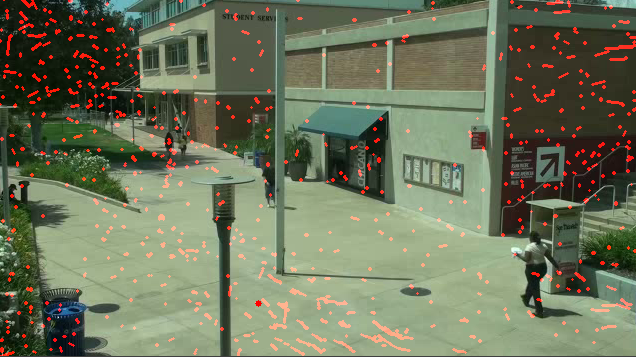

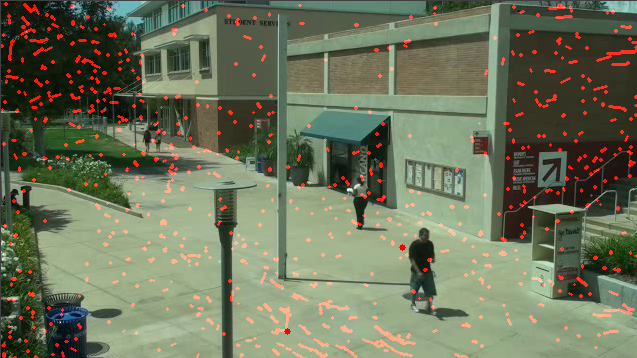

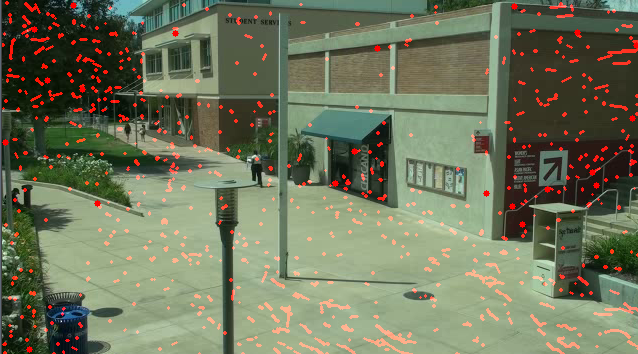

FileNotFoundError: ignored

In [ ]:
listOfImageNames = ['screenshots/part5/shitomasi/experiment2/Screenshot_1.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_2.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_3.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_4.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_5.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_6.png',
                    'screenshots/part5/shitomasi/experiment2/Screenshot_7.png'
                    ]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

Παρατηρούμε λοιπόν ότι η ύπαρξη θορύβου έχει ως αποτέλεσμα την ανίχνευση περισσότερων σημείων στον χώρο τα οποία δεν αντιστοιχούν σε πραγματική κίνηση. Ως εκ τούτου, όταν οι κινούμενοι άνθρωποι χάνονται στο βάθος της εικόνας - κάτι που ερμηνεύεται σε πιο αργή κίνηση μετά από ένα σημείο - οι ανιχνευτές αποτυγχάνουν να εντοπίσουν την κίνηση τους (παράλειψη σημείων ενδιαφέροντος), κάτι το οποίο δεν συνέβαινε στα προηγούμενα ερωτήματα που δεν είχαμε θόρυβο. Η συμπεριφορά αυτή στην παρακολούθηση οπτικής ροής είναι εν μέρει αναμενόμενη, καθώς ο αλγόριθμος μας στηρίζεται στην χρήση Γκαουσσιανών φιλτραρισμάτων, τα οποία δεν ενδείκνυνται στην εξάλειψη salt and pepper noise.